In [2]:
import re,string
import csv
import Sastrawi
import string
import numpy as np
from Sastrawi.Stemmer.StemmerFactory import StemmerFactory
from Sastrawi.StopWordRemover.StopWordRemoverFactory import StopWordRemoverFactory
import preprocessor as p
import pandas as pd
import numpy as np
from collections import Counter
from sklearn.svm import SVC
from sklearn.metrics import precision_score, recall_score, f1_score, roc_auc_score, accuracy_score, classification_report
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import seaborn as sns
import time

In [3]:
data = pd.read_csv('data_final_revisi.csv', sep=';')

print (data.columns)
# print (data)

Index(['text', 'category'], dtype='object')


In [4]:
data.shape

(13420, 2)

Text(0.5,1,'Class Distributions \n')

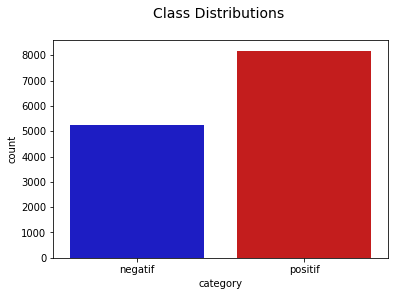

In [5]:
colors = ["#0101DF", "#DF0101", "#0F0101"]

sns.countplot('category', data=data, palette=colors)
plt.title('Class Distributions \n', fontsize=14)

In [6]:
data.groupby('category').size()

category
negatif    5239
positif    8181
dtype: int64

In [7]:
#CASEFOLDING
row_result = []
with open('data_final_revisi.csv') as infile:
    reader = csv.reader(infile, delimiter=';',quotechar='|', quoting=csv.QUOTE_MINIMAL)
    for row in reader:
        row = [word.lower() for word in row]
        row_result.append(row)
print (row_result)

[['text', 'category'], [' kecewa kadernya tidak jadi menteri  pbnu : jokowi bisa kualat! https://t.co/ayayr7zytr ', 'negatif'], [' - politik bagi bagi kekuasaan.- melanggar uu.- pemborosan anggaran.- unfaedah.#rezimpenghancurbangsa wakil menteri jokowi itu jelas politik bagi-bagi kekuasaan https://t.co/ud7cxzro5e lewat @idtodaydotco ', 'negatif'], ['  ppp desak jokowi segerakan cari lima wakil menteri saya bukan tertarik dgn berita itu  \\ yang menarik adalah pada foto di berita itu  seharusnya foto presiden dong  bukan foto menhan @prabowo @cnnindonesia ada2 aja ah#menhanskillpresiden https://t.co/czoxkxohxo ', 'negatif'], ['  yang paling ikhlas  yaaa...prabowo - gus dur -yg dituduh penculik  pelanggar ham  pendukung radikal radikul kini tlh resmi menjabat menteri pertahanan ri. https://t.co/phyw2osekj ', 'negatif'], [' ###maluku for jokowi###tapi sayangnya putra dan putri maluku tidak ada yg dipilih jokowi jadi menteri.pelajaran bagi putra dan putri maluku. ', 'negatif'], [' #       

In [7]:
#MENGHAPUS MENTION, HASHTAG, URL (EXT ASCII)

row_result1 = []

for row in row_result:
    re_sub = re.sub(r"pic\s+", "", row[0])
    re_sub = re.sub(r"https\S+","", re_sub)
    re_sub = re.sub(r"https://t.co/\S+","", re_sub)
    re_sub = re.sub(r"http\S+","", re_sub)
    re_sub = re.sub(r"@\S+","", re_sub)
    re_sub = re.sub(r"#\S+","", re_sub)
    re_sub = re.sub(r"<\S+","", re_sub)
    re_sub = re.sub(r"^\n\S+","", re_sub)
    re_sub = re.sub(r"[^\x09\x0A\x0D\x20-\x7F]","", re_sub)
#         stemmer_result = stemmer.stem(re_sub)
    row[0] = re_sub
    row_result1.append(row)
print (row_result1)
#     for row in row_result :
#         print row


[['text', 'category'], [' kecewa kadernya tidak jadi menteri  pbnu : jokowi bisa kualat!  ', 'negatif'], [' - politik bagi bagi kekuasaan.- melanggar uu.- pemborosan anggaran.- unfaedah. wakil menteri jokowi itu jelas politik bagi-bagi kekuasaan  lewat  ', 'negatif'], ['  ppp desak jokowi segerakan cari lima wakil menteri saya bukan tertarik dgn berita itu  \\ yang menarik adalah pada foto di berita itu  seharusnya foto presiden dong  bukan foto menhan   ada2 aja ah  ', 'negatif'], ['  yang paling ikhlas  yaaa...prabowo - gus dur -yg dituduh penculik  pelanggar ham  pendukung radikal radikul kini tlh resmi menjabat menteri pertahanan ri.  ', 'negatif'], ['  for jokowi sayangnya putra dan putri maluku tidak ada yg dipilih jokowi jadi menteri.pelajaran bagi putra dan putri maluku. ', 'negatif'], [' #        lol bu susi kok ga jadi menteri lagi ', 'negatif'], ['  beban prabowo dan menteri jokowi 5 tahun ke depan -         ', 'negatif'], ['  98 tolak prabowo di kabinet jokowi - detiknews  

In [8]:
#MENGHAPUS ANGKA DAN TANDA BACA

newrow2=[]
conversion = set('][,1234567890-{!@#$-%&?*+Â=_"~/\<)}(>;:’,.|')
for row in row_result1:
    newrow = [''.join(' ' if c in conversion else c for c in entry) for entry in row]
    newrow2.append(newrow)
#print (newrow2)
print(newrow2)

[['text', 'category'], [' kecewa kadernya tidak jadi menteri  pbnu   jokowi bisa kualat   ', 'negatif'], ['   politik bagi bagi kekuasaan   melanggar uu   pemborosan anggaran   unfaedah  wakil menteri jokowi itu jelas politik bagi bagi kekuasaan  lewat  ', 'negatif'], ['  ppp desak jokowi segerakan cari lima wakil menteri saya bukan tertarik dgn berita itu    yang menarik adalah pada foto di berita itu  seharusnya foto presiden dong  bukan foto menhan   ada  aja ah  ', 'negatif'], ['  yang paling ikhlas  yaaa   prabowo   gus dur  yg dituduh penculik  pelanggar ham  pendukung radikal radikul kini tlh resmi menjabat menteri pertahanan ri   ', 'negatif'], ['  for jokowi sayangnya putra dan putri maluku tidak ada yg dipilih jokowi jadi menteri pelajaran bagi putra dan putri maluku  ', 'negatif'], ['          lol bu susi kok ga jadi menteri lagi ', 'negatif'], ['  beban prabowo dan menteri jokowi   tahun ke depan           ', 'negatif'], ['     tolak prabowo di kabinet jokowi   detiknews   

In [9]:
#tokenizing

import nltk
nltk.download('punkt')
from nltk.tokenize import word_tokenize
from nltk.tokenize import sent_tokenize, word_tokenize
#TOKENIZE
Trow=[]
for row in newrow2:
    word_tokens = word_tokenize(row[0])
    Trow.append(word_tokens)
        
token_list = Trow

for row in token_list:
    print (row)



[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\asus\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
['text']
['kecewa', 'kadernya', 'tidak', 'jadi', 'menteri', 'pbnu', 'jokowi', 'bisa', 'kualat']
['politik', 'bagi', 'bagi', 'kekuasaan', 'melanggar', 'uu', 'pemborosan', 'anggaran', 'unfaedah', 'wakil', 'menteri', 'jokowi', 'itu', 'jelas', 'politik', 'bagi', 'bagi', 'kekuasaan', 'lewat']
['ppp', 'desak', 'jokowi', 'segerakan', 'cari', 'lima', 'wakil', 'menteri', 'saya', 'bukan', 'tertarik', 'dgn', 'berita', 'itu', 'yang', 'menarik', 'adalah', 'pada', 'foto', 'di', 'berita', 'itu', 'seharusnya', 'foto', 'presiden', 'dong', 'bukan', 'foto', 'menhan', 'ada', 'aja', 'ah']
['yang', 'paling', 'ikhlas', 'yaaa', 'prabowo', 'gus', 'dur', 'yg', 'dituduh', 'penculik', 'pelanggar', 'ham', 'pendukung', 'radikal', 'radikul', 'kini', 'tlh', 'resmi', 'menjabat', 'menteri', 'pertahanan', 'ri']
['for', 'jokowi', 'sayangnya', 'putra', 'dan', 'putri', 'malu

['sebaiknya', 'para', 'menteri', 'jangan', 'terlalu', 'banyak', 'ngomong', 'di', 'publik', 'selesaikan', 'dulu', 'intern', 'baru', 'ngomong', 'ke', 'publik', 'membingungkan', 'rakyat', 'pak', 'md']
['tugas', 'baru', 'seorang', 'menteri', 'top', 'sibuk', 'ngetwitt', 'dan', 'pamer', 'cwiiihhhh']
['bu', 'susi', 'tidak', 'dipilih', 'jadi', 'menteri', 'tapi', 'tetap', 'di', 'hati', 'terlanjur', 'cinta', 'mo', 'gmana', 'lagi', 'no', 'susi', 'no', 'party']
['bu', 'susi', 'mah', 'kalah', 'sama', 'menteri', 'macam', 'yasonna', 'laoly', 'yang', 'jelas', 'korupsi', 'tapi', 'tetep', 'lanjut', 'lagi']
['mantan', 'militer', 'jadi', 'menteri', 'agama', 'org', 'yg', 'ga', 'punya', 'pengalaman', 'di', 'dunia', 'olahraga', 'jadi', 'menpora', 'tangan', 'kanan', 'prabowo', 'gantiin', 'bu', 'susi', 'karepmu', 'piye', 'to', 'pak', 'ini', 'hak', 'prerogatif', 'atau', 'pesenan', 'partai']
['pak', 'lebih', 'memilih', 'menteri', 'lamanya', 'macam', 'budi', 'karya', 'yasonna', 'laoly', 'luhut', 'binsar', 'daripa

['aku', 'sedihnya', 'bu', 'susi', 'udah', 'nggak', 'jadi', 'menteri', 'lagi']
['aku', 'terkaget', 'kaget', 'liat', 'komposisi', 'kabinet', 'pak', 'jokowi', 'lebih', 'terkaget', 'kaget', 'lagi', 'ada', 'yang', 'menganggap', 'tidak', 'ada', 'yang', 'aneh', 'dengan', 'komposisi', 'itu']
['aku', 'tidak', 'bisa', 'membayangkan', 'para', 'pendeta', 'di', 'gereja', 'saat', 'kotbah', 'karna', 'benar', 'menteri', 'agama', 'bukan', 'untuk', 'agama', 'tapi', 'dengan', 'menteri', 'agama', 'dari', 'militer', 'mengancam', 'semua', 'agama', 'pemerintah', 'terlalu', 'buruk', 'memaknai', 'deradikalisasi', 'dengan', 'penunjukkan', 'menag', 'baru', 'ini', 'agama', 'adalah', 'agama']
['analisa', 'pak', 'ray', 'c', 'kecewa', 'pa', 'sayangkan', 'prabowo', 'jadi', 'menteri', 'via']
['analisa', 'pasca', 'penyusunan', 'kabinet', 'respon', 'masyarakat', 'pd', 'komposisi', 'kabinet', 'terlihat', 'cenderung', 'negatif', 'trhdp', 'jokowi', 'kekecewaan', 'meluas', 'itu', 'justeru', 'terjadi', 'di', 'pendukung', 'or

['dari', 'gojek', 'ke', 'menteri', 'pendidikan', 'menpora', 'yang', 'akhirnya', 'tak', 'berkumis', 'dan', 'menteri', 'dari', 'partai', 'yg', 'isunya', 'mau', 'jadi', 'oposisi', 'sampai', 'bu', 'susi', 'yg', 'tak', 'direkrut', 'kembali', 'itulah', 'serba', 'serbi', 'transfer', 'window', 'menteri', 'musim', 'ini']
['dari', 'kemarin', 'masih', 'menunggu', 'berharap', 'saat', 'td', 'diumumin', 'jd', 'sedih', 'kecewa', 'sang', 'menteri', 'idola', 'tdk', 'ada', 'di', 'jajaran', 'kabinet', 'indonesia', 'maju', 'skrg', 'hanya', 'bs', 'berharap', 'moga', 'penggantinya', 'dpt', 'seberani', 'setegas', 'bu', 'susi', 'keep', 'it', 'rock', 'bu']
['dari', 'sekian', 'kemungkinan', 'pak', 'jkw', 'menempatkan', 'nadiem', 'makarim', 'sebagai', 'mendikbud', 'what', 'a', 'joke']
['dari', 'seluruh', 'nama', 'menteri', 'kok', 'sayang', 'ya', 'bu', 'susi', 'ga', 'di', 'panggil', 'lagi']
['dari', 'semua', 'menteri', 'baru', 'saya', 'paling', 'kecewa', 'ketika', 'bu', 'susi', 'tak', 'dipanggil', 'kembali', 'but

['menteri', 'yg', 'harusnya', 'di', 'pertahankan', 'wahai', 'presiden', 'kami', 'tlg', 'dengar', 'suara', 'kami', 'suara', 'yg', 'keluar', 'dari', 'dalamnya', 'nurani', 'dan', 'ketulusan', 'bukan', 'pamrih', 'karena', 'koalisi', 'atau', 'oposisi', 'tp', 'krn', 'ingin', 'negeri', 'ini', 'lbh', 'maju', 'dan', 'diperhitungkan', 'dikancah', 'dunia']
['menteri', 'yg', 'kinerja', 'nya', 'plg', 'bagus', 'malah', 'g', 'dipanggil', 'lg', 'bu', 'susi', 'menteri', 'yg', 'terbukti', 'gagal', 'mlh', 'dipilih', 'lg', 'yasonna', 'budi', 'karya', 'siti', 'nurbaya', 'pft']
['menteri', 'yg', 'ku', 'idolakan', 'banget', 'ga', 'masuk', 'kabinet', 'jokowi', 'jilid']
['menteri', 'kabinet', 'baru', 'periode', 'yg', 'islamophobic', 'menkopolhukam', 'menteri', 'agama', 'menteri', 'dalam', 'negeri', 'dll', 'sepertinya', 'akan', 'selalu', 'ada', 'penambahan', 'yang', 'baru']
['menurut', 'lo', 'kenapa', 'bu', 'susi', 'nggak', 'diajak', 'hang', 'lagi', 'jadi', 'menteri']
['menurut', 'sya', 'agak', 'kurang', 'tepat

['tiada', 'chemistry', 'gmn', 'mau', 'kerja', 'memang', 'ga', 'serius', 'tp', 'retorikanya', 'serius', 'harusnya', 'wamen', 'yg', 'mengerti', 'persoalan', 'dasar', 'pemilihan', 'wamen', 'dan', 'menteri', 'hanya', 'kepentingan', 'politik', 'kabinet', 'politik', 'kepentingan', 'mengatasnakan', 'kabinet', 'indonesia', 'maju']
['tiap', 'inget', 'prabowo', 'jadi', 'menteri', 'bawaannya', 'pengen', 'ngakak', 'aja', 'hahaha']
['tiap', 'menko', 'punya', 'hak', 'veto', 'setiap', 'kebijakan', 'yg', 'di', 'keluarkan', 'oleh', 'menteri', 'di', 'bawah', 'koordinasinya', 'yg', 'di', 'atur', 'di', 'perpres', 'berarti', 'prabowo', 'di', 'bawah', 'mahfud', 'mdjadi', 'para', 'kampret', 'jangan', 'ke', 'gr', 'an', 'jokowi', 'juga', 'ga', 'bodoh']
['tiba', 'babeh', 'w', 'blg', 'nadiem', 'makarim', 'jd', 'mendik', 'bud', 'dia', 'bisa', 'ciptain', 'gojek', 'nanti', 'buat', 'sekolah', 'yg', 'anaknya', 'bodoh', 'dia', 'ciptain', 'go', 'blo', 'hah', 'ha', 'ha', 'ha', 'lucu', 'ha', 'ha', 'ha', 'ngeselin', 'lu',

['kabupaten', 'grobogan', 'semoga', 'dengan', 'komposisi', 'kabinet', 'ciamik', 'jilid', 'ke', 'ini', 'indonesia', 'bisa', 'semakin', 'berdaya', 'dan', 'maju', 'melesat', 'menembus', 'batas', 'dari', 'segi', 'apapun', 'entah', 'itu', 'pendidikan', 'ekonomi', 'maupun', 'keamanan']
['ini', 'case', 'awal', 'seberapa', 'serius', 'susunan', 'tni', 'dan', 'polri', 'dalam', 'kabinet', 'kita', 'mau', 'mengakhiri', 'radikalisme']
['briliannya', 'pemikiran', 'memilih', 'menteri', 'agama', 'dari', 'kalangan', 'militer', 'yg', 'paham', 'ttg', 'islam', 'bkn', 'dr', 'organisasi', 'besar', 'islam', 'utk', 'memberantas', 'intoleran', 'radikal', 'adlh', 'agar', 'menghindari', 'konflik', 'antar', 'organisasi', 'islam']
['bagaimanapun', 'latarbelakang', 'mereka', 'para', 'menteri', 'yg', 'baru', 'insyaallah', 'pakdhe', 'lebih', 'tau', 'kapabilitas', 'orang', 'yg', 'akan', 'membantunya', 'untuk', 'tahun', 'kedepan']
['di', 'pundakmu', 'aku', 'titipkan', 'amanah', 'untuk', 'menteri', 'baru', 'dan', 'yg', '

['semoga', 'menteri', 'pilihan', 'pak', 'jokowi', 'pada', 'kabinet', 'indonesia', 'maju', 'membuahkan', 'hasil', 'yg', 'gemilang']
['semoga', 'menteri', 'yg', 'kmrin', 'dilantik', 'presiden', 'utk', 'periode', 's', 'd', 'tidak', 'ada', 'yg', 'tersandung', 'kasus', 'korupsi', 'amin']
['semoga', 'para', 'menteri', 'benar', 'menjalan', 'kan', 'tugas', 'nya', 'dgn', 'ikhlas', 'ridho', 'dan', 'krj', 'keras', 'demi', 'bangsa', 'dan', 'negara', 'indonesia', 'jgn', 'korupsi', 'ingat', 'allah', 'maha', 'melihat', 'dan', 'maha', 'mengetahui']
['semoga', 'para', 'menteri', 'dapat', 'mengikuti', 'irama', 'kerja', 'pak', 'presiden', 'dan', 'bisa', 'membantu', 'pak', 'jokowi', 'membawa', 'indonesia', 'kearah', 'yg', 'lrbih', 'maju', 'makmur', 'dan', 'sejahtera', 'dan', 'semoga', 'semua', 'yang', 'radikal', 'di', 'bumi', 'pertiwi', 'indonesia', 'bisa', 'di', 'lenyapkan', 'sukses', 'selalu', 'buat', 'pak', 'jokowi', 'god', 'bless', 'you', 'always']
['semoga', 'para', 'menteri', 'pilihan', 'presiden', 

['terima', 'kasih', 'banyak', 'jasa', 'dan', 'pengabdian', 'nya', 'buat', 'bangsa', 'ini', 'bu', 'susi', 'rakyat', 'merindukan', 'dirimu', 'di', 'saat', 'kapal', 'ilegal', 'di', 'tenggelamkan', 'kami', 'sangat', 'sedih', 'ibu', 'sudah', 'tidak', 'lagi', 'menjabat', 'sebagai', 'menteri']
['terima', 'kasih', 'bnyak', 'bu', 'susi', 'menteri', 'ku', 'yang', 'terfavorit', 'nan', 'bergaya', 'nyentrik', 'terim', 'kasih', 'banyak', 'atas', 'kinerja', 'ibu', 'slma', 'ini', 'b']
['terima', 'kasih', 'bu', 'anda', 'menteri', 'kebanggaan', 'dan', 'kesayangan', 'kami', 'rakyat', 'indonesia', 'nuhun', 'bu', 'susi']
['terima', 'kasih', 'bu', 'kami', 'rakyat', 'indonesia', 'bangga', 'pernah', 'punya', 'menteri', 'seperti', 'bu', 'susi', 'semoga', 'bu', 'susi', 'sehat', 'selalu']
['terima', 'kasih', 'bu', 'sebenarnya', 'kami', 'msh', 'menginginkan', 'ibu', 'dedikasi', 'ibu', 'untuk', 'negara', 'ini', 'luar', 'biasa', 'kami', 'sangat', 'bersykur', 'pernah', 'memeiliki', 'menteri', 'luar', 'biasa', 'seper

['dit', 'psma', 'mengucapkan', 'selamat', 'datang', 'dan', 'selamat', 'bertugas', 'kepada', 'mendikbud', 'bapak', 'nadiem', 'anwar', 'makarim', 'semoga', 'amanah', 'dalam', 'memajukan', 'pendidikan', 'dan', 'kebudayaan', 'indonesia']
['dlm', 'rangka', 'merayakan', 'pelantikan', 'pak', 'nadiem', 'makarim', 'apa', 'tida', 'ada', 'promo', 'gojek']
['doa', 'dahlan', 'iskan', 'untuk', 'nadiem', 'makarim']
['doa', 'pks', 'untuk', 'prabowo', 'semoga', 'jadi', 'menteri', 'terbaik']
['doa', 'santri', 'yang', 'terkabulkan', 'alhamdulillah', 'selamat', 'sukses', 'untuk', 'semua', 'menteri', 'kabinet', 'kerja', 'jilid', 'dua', 'semangat', 'selalu', 'untuk', 'indonesia', 'maju']
['doa', 'yg', 'tulus', 'bagi', 'bpk', 'dan', 'seluruh', 'kabinet']
['dpp', 'partai', 'demokrat', 'menghormati', 'keputusan', 'presiden', 'joko', 'widodo', 'dalam', 'menyusun', 'kabinet', 'indonesia', 'maju', 'yang', 'tidak', 'mengikutsertakan', 'kader', 'partai', 'demokrat', 'kewenangan', 'memilih', 'menteri', 'merupakan', 

['mungkin', 'baru', 'kali', 'ini', 'tertarik', 'sama', 'mentri', 'agama', 'selamat', 'bekerja', 'pak']
['mungkin', 'bisa', 'lihat', 'kinerja', 'kabinet', 'jokowi', 'untuk', 'hari', 'kedepan', 'mari', 'saling', 'bahu', 'membahu', 'membangun', 'indonesia']
['mungkin', 'd', 'm', 'ngsa', 'dan', 'n', 'egara', 'semangat', 'mas', 'erick', 'thohir', 'tolak', 'kursi', 'menteri', 'jika', 'jokowi', 'menang']
['mungkin', 'ini', 'acara', 'lepas', 'sambut', 'menteri', 'paling', 'emosial', 'hari', 'ini', 'terima', 'kasih', 'ibu']
['mungkin', 'menteri', 'bumn', 'yang', 'baru', 'bisa', 'menyelesaikan', 'masalah', 'ini', 'terima', 'kasih']
['nadhif', 'rnadin', 'amizahnadiem', 'makarimseneng', 'bgt', 'punya', 'keluarga', 'yg', 'top', 'top', 'begini']
['nadiem', 'anwar', 'makarim', 'mantan', 'ceo', 'diminta', 'pakdhe', 'utk', 'jadi', 'berharap', 'ada', 'terobosan', 'yg', 'signifikan', 'dlm', 'pengembangan', 'sdm', 'menyiapkan', 'sdm', 'yg', 'siap', 'kerja', 'link', 'and', 'match', 'pendidikan', 'dg', 'ind

['selamat', 'atas', 'dilantiknya', 'menteri', 'pdtt', 'gus', 'abdul', 'halim', 'isakandar']
['selamat', 'atas', 'dilantiknya', 'menteri', 'menteri', 'kabinet', 'kerja', 'ii', 'yang', 'baru', 'semoga', 'amanah', 'menjalankan', 'tugas', 'dan', 'membawa', 'perubahan', 'yg', 'lebih', 'baiktp', 'sayang', 'sekali', 'bu', 'tidak', 'dipilih', 'pak', 'jokowi', 'lg']
['selamat', 'atas', 'dilantiknya', 'nadiem', 'anwar', 'makarim', 'sebagai', 'menteri', 'pendidikan', 'dan', 'kebudayaan', 'selamat', 'bekerja']
['selamat', 'atas', 'dilantiknya', 'pak', 'sebagai', 'menteri', 'desa', 'pdtt', 'tahun', 'kedepan', 'semoga', 'diberi', 'kesehatan', 'kekuatan', 'dalam', 'menjalankan', 'tugasnya']
['selamat', 'atas', 'dilantiknya', 'pak', 'sebagai', 'menteri', 'desa', 'pdtt', 'semoga', 'diberi', 'kesehatan', 'kekuatan', 'dalam', 'menjalankan', 'tugasnya']
['selamat', 'atas', 'dilantiknya', 'pak', 'sebagai', 'menteri', 'pariwisata', 'dan', 'ekonomi', 'kreatif']
['selamat', 'atas', 'dilantiknya', 'pak', 'ment

['selamat', 'kepada', 'bapak', 'sebagai', 'wakil', 'menteri', 'agama', 'ri', 'semoga', 'sukses', 'dlm', 'mengembang', 'amanah', 'aamiin']
['selamat', 'kepada', 'bapak', 'a', 'halim', 'iskandar', 'atas', 'pelantikan', 'sebagai', 'menteri', 'desa', 'dan', 'pdtt', 'semoga', 'amanah']
['selamat', 'kepada', 'bapak', 'abdul', 'halim', 'iskandar', 'atas', 'ditunjuknya', 'sebagai', 'menteri', 'desa', 'dan', 'pdtt']
['selamat', 'kepada', 'bapak', 'abdul', 'halim', 'iskandar', 'atas', 'dilantiknya', 'sebagai', 'menteri', 'desa', 'pdtt', 'dan', 'transmigrasi', 'ri', 'periode']
['selamat', 'kepada', 'bapak', 'abdul', 'halim', 'iskandar', 'atas', 'dilantiknya', 'sebagai', 'menteri', 'desa', 'pdtt', 'dan', 'transmigrasi', 'republik', 'indonesia', 'periode']
['selamat', 'kepada', 'bapak', 'abdul', 'halim', 'iskandar', 'atas', 'dilantiknya', 'sebagai', 'menteri', 'pdtt', 'semoga', 'menjadi', 'rahmat', 'bagi', 'masyarakat', 'desa']
['selamat', 'kepada', 'bapak', 'abdul', 'halim', 'iskandar', 'atas', 'm

['terima', 'jabatan', 'menteri', 'erick', 'thohir', 'berhenti', 'total', 'dari', 'bisnis', 'langkah', 'tepat', 'yang', 'diputuskan', 'oleh', 'erick', 'thohir', 'lebih', 'baik', 'fokus', 'menjadi', 'menteri', 'bumn', 'agar', 'bumn', 'kita', 'tumbuh', 'sehat', 'dan', 'menguntungkan']
['terima', 'kasih', 'sudah', 'memilih', 'menteri', 'menteri', 'tidak', 'kompeten', 'yang', 'membuat', 'saya', 'sangat', 'kecewa', 'i', 'hate', 'you']
['terima', 'kasih', 'atas', 'dedikasi', 'kepercayaanya', 'pak', 'mohon', 'bimbingan', 'arahan', 'rujukan', 'kritik', 'saran', 'abang', 'u', 'tahun', 'ke', 'depan', 'kalimat', 'pertamawishnutama', 'nadiem', 'makarimpasca', 'di', 'invite', 'di', 'grup', 'kabinet']
['terima', 'kasih', 'atas', 'dedikasi', 'yg', 'telah', 'ibu', 'berikan', 'selama', 'menjabat', 'sebagai', 'menteri', 'kelautan', 'dan', 'perikanan', 'indonesia', 'tahun', 'semoga', 'tuhan', 'membalas', 'semua', 'kebaikan', 'dan', 'kerja', 'keras', 'ibu', 'indonesia', 'will', 'miss', 'you', 'bu', 'susi']

In [10]:
#filtering

import numpy as np
result = []
filter_word = {'twit':None,'ex':None,'rt':None, 'gue': 'aku', 'gua': 'aku', 'aq': 'aku', 'ak': 'aku', 'q': 'aku', 'tag':None, 'tanyarl':None, 'seneng':'senang',
               'oh':None, 'ohh':None,  'gw': 'aku', 'pls':None, 'plss':None, 'plsss':None, 'cape' : 'capek', 'wis':None, 'wait':None, 
               'kalo':None, 'klo':None, 'kalau':None, 'hehe':None, 'hehehe':None, 'haha':None, 'hahaha':None, 'hihihi':None, 'sad':'sedih', 
               'wkwk' : None, 'wkwkwk':None, 'awokawoka':None, 'ae':None, 'ap':None, 'hm':None , 'hmm':None , 'hmmm':None,
               'hmmmm':None, 'mmmmm':None, 'karo':None, 'hmmmmmm':None,  'hadu':None , 'haduu':None , 'haduuu':None,
               'haduh':None, 'haduuh':None, 'jare':None,  'guys':None, 'guyss':None, 'gaes':None, 'ges':None,
               'haduuuh':None, 'haadu':None, 'haaduu':None, 'haaduuu':None , 'haaduh':None, 'lho':None,
               'haaduuh':None, 'haaduuuh':None , 'haaadu ':None , 'haaaduu':None , 'haaaduuu':None, 'haaadudu':None,
               'haaaduuh':None, 'haaaduuuh' : None,  'aamiin':None, 'apasih':None, 'wkwk':None, 'wkwkw':None,
               'cie':None, 'wkwkwkw':None, 'wkwkwkwk':None, 'wkwkwkwkw':None,  'wkwkwkwkwk':None, 'ea':None, 'eaa':None,
               'eaaa':None, 'eaaaa':None, 'eaaaaa':None, 'eea':None, 'eeaa':None, 'tweet':None, 'jpn':None, 'heh':None,
               'kon':None, 'rip':None, 'uhuy':None, 'uhuuy':None, 'ngehype':None, 'a':None, 'b':None, 'c':None,'d':None,
               'e':None,'f':None,'g':None,'h':None,'i':None,'j':None,'k':None,'l':None,'m':None,'n':None,'o':None,'p':None,
               'q':None,'r':None,'s':None,'t':None,'u':None,'v':None,'w':None,'x':None,'y':None,'z':None,'tft':None,
               'aa':None, 'aaa':None, 'eh' : None, 'askfm':None, 'kok':None, 'pa':None, 'nih':None, 'besaar':'besar', 'bsr':'besar',
               'nemu':'menemukan', 'tags':None, 'tagg':None, 'taggg':None, 'cod':None, 'mo':None, 'he':None,
               'udah': 'sudah', 'udh':'sudah', 'gtu': 'begitu', 'thread':None, 'sih':None, 'sbg':'sebagai', 'pd':'pada',
               'kuwik':None, 'dudes':None, 'wes':None, 'iki':None, 'wkkw':None, 'lol':None, 'mensen':None, 'ndang':None, 'pas':None, 
               'nder':None, 'askmf':None, 'retweet':None, 'an':None, 'yak':'ya','nnton':'menonton', 'tp' : 'tapi', 'koyo':None, 'puol':None, 'pgn':None, 'pen':None, 'apk':None,
               'aing':None, 'ako':'aku', 'akoo':'aku', 'qm':'kamu', 'km':'kamu', 'ente':None, 'koe':None, 'apaqa':None,
               'gtg':None, 'sco':None, 'smwa':None, 'kayak':None, 'ah':None, 'tadii':None, 'bggt':None, 'fess':None,
               'tu':None, 'kek':None, 'karna':'karena', 'pel':None, 'gans':None, 'mah':None, 'loh':None, 'anf':None,
               'nya':None, 'ku':None, 'mu':None, 'lah':None,'lahh':None, 'amp':None, 'wkwkwkwkwkwk':None, 'ki':None, 'rb':None,
               'dong':None, 'dongg':None, 'donggg':None, 'ih':None, 'ewh':None, 'gtlt':None, 'polbek':None, 'dipolbek':None,
               'azek':None, 'dir':None, 'ko':None, 'ni':None,'kj':None, 'sp':None, 'bs':'bisa', 'fan':None, 'pw':None,
               'doang':None, 'kyke':None, 'mnfs':None, 'tbtb':None, 'tb':None, 'ttp':None, 'kyk':'seperti', 'iso':None,
               'pye':None, 'piye':None, 'hbs':'habis', 'kayanya':'sepertinya',  'neng':None, 'pula':None, 'ttg':'tentang', 'wae':None,
               'njobo':None, 'telese':None, 'ble':None, 'fa':None, 'su':None, 'sg':None, 'ra':None, 'tq':None,
               'kerad':None, 'lur':None, 'apaka':'apakah', 'apaqa':'apakah', 'adala':'adalah', 'dg':'dengan', 'wkwkkwk':None,
               'nnt':'nanti', 'sm':None, 'hooh':None, 'huum':None, 'apaa':None, 'skrg':'sekarang', 'gituu':'gitu', 'guee':'aku', 'sgt':'sangat',
               'ngaqaq':'ngakak', 'test':None, 'kui':None, 'amin':None,  'aamiin':None, 'amiiin':None, 'aamiiiiin':None,
               'duh':None, 'jdi':'jadi', 'ngakak':None, 'tpi':'tapi', 'tp' : 'tapi', 'ajaa': 'saja', 'keknya': 'sepertinya',
               'xd':None, 'ngemeng': 'ngomong', 'msh':'masih', 'ngapa':None, 'po':None, 'qna':None, 'wqwq':None,
               'cm':None, 'gais':None, 'dgn':'dengan', 'utk':'untuk', 'mrk':None, 'nga':None, 'min':None, 'lay':None, 'ya':None,
               'admin':None, 'yng':None, 'follback':None, 'sjw':None, 'sjws':None, 'dlogok':None, 'kowe':None, 'sy':'saya',
               'pie':None, 'to':None, 'qotd':None, 'via':None, 'adlh':'adalah', 'adl':'adalah', 'ahaha':None,'ngerasa' : 'merasa',
               'malem' : 'malam', 'anjeng':'anjing', 'njeng':'anjing', 'gamau' : 'tidak mau', 'gatau' : 'tidak tau',
               'gapapa' : 'tidak apa', 'kk' : 'kakak', 'ijinin' : 'mengizinkan', 'gpp' : 'tidak apa', 'gasuka' : 'tidak suka',
               'abis' : 'habis', 'dateng' : 'datang', 'maen' : 'main', 'maem' : 'makan', 'jkt' : 'jakarta', 'bg' :None, 'sel':None,
               'anjir' : 'anjing', 'njir' : 'anjing', 'njirr' : 'anjing', 'org' : 'orang', 'bgst' : 'bangsat',
               'bgsd' : 'bangsat', 'njirrr' : 'anjing', ' anjay ' : 'anjing', 'anying' : 'anjing', 'nying' : 'anjing',
               'bgsd' : 'bangsat', 'tae':'tai', 'ngenes' : 'ngenas', 'yg' : 'yang', 'ga' : 'tidak', 'gak' : 'tidak',
               'nggak' : 'tidak', 'jd' : 'jadi', 'krn' : 'karena', 'temen' : 'teman', 'blm' : 'belum', 'bgt' : 'banget',
               'belom' : 'belum', 'jgn' : 'jangan', 'gt' : 'begitu', 'ultah' : 'ulang tahun', 'brrti' : 'berarti', 
               'bbrp' : 'beberapa', 'milihin' : 'pilihkan', 'kating' : 'kakak tingkat', 'pke':'pakai', 'pake' : 'pakai',
               'ilang':'hilang', 'ngarep':'berharap',  'jele' : 'jelek',  'galo' : 'galau', 'nonton' : 'menonton',
               'cowo' : 'cowok', 'cewe' : 'cewek', 'dpt' : 'dapat', 'dr' : 'dari', 'positive' : 'positif', 'knp' : 'kenapa',
               'nyindir' : 'menyindir', 'gbisa' : 'tidak bisa', 'hp' : 'ponsel', 'gausah' : 'tidak usah', 'males':'malas',
               'ngomongnya' : 'bilangnya', 'dalem':'dalam',  'megang' : 'memegang', 'gabakal' : 'tidak bakal',
               'gaseneng' : 'tidak senang', 'nglewatin' : 'melewatkan', 'mon' : 'mohon', 'maap' : 'maaf', 'kalyan' : 'kalian',
               'skrng' : 'sekarang', 'bljr' : 'belajar', 'nntn' : 'menonton', 'gakeliatan' : 'tidak terlihat', 'liat' : 'lihat',
               'sklh' : 'sekolah',  'terimakasih' : 'terima kasih', 'engga' : 'tidak', 'tida' : 'tidak', 'nyeluk' : 'memanggil',
               'bsk' : 'besok',  'nanya' : 'tanya', 'ngimpi' : 'mimpi', 'ntar' : 'nanti',  'ngomongin':'membicarakan',
               'ngobrol' : 'berbincang', 'kgn' : 'kangen', 'boong' : 'bohong', 'trnyta' : 'ternyata', 'pusink' : 'pusing',
               'rasane' : 'rasanya', 'ktwa' : 'ketawa', 'sndiri' : 'sendiri', 'ndiri' : 'sendiri', 'tdk' : 'tidak',
               'jl':'jalan', 'gapernah' : 'tidak pernah', 'lgsg' : 'langsung', 'palanya' : 'kepalanya', 'tak' : 'tidak', 'tdak':'tidak', 'tidk' : 'tidak',
               'sampe' : 'sampai', 'ampe':'sampai', 'adek' : 'adik', 'temenmu' : 'temanmu', 'nyolong' : 'mencuri',
               'gabisa' : 'tidak bisa', 'ngagetin' : 'mengagetkan', 'asu' : 'anjing',  'nyokap' : 'ibu', 'diem':'diam', 'aje':'aja',
               'bokap' : 'ayah', 'medsos' : 'media sosial', 'kemisqueenan' : 'kemiskinan', 'bgstt':'bangsat', 'klu':None, 'komen':'komentar',
               'bgsttt':'bangsat', 'kocheng':'kucing', 'bodo':'bodoh', 'gajadi' : 'tidak jadi', 'blg' : 'bilang',
               'endut' : 'gendut','ngaji':'mengaji', 'ngomong' : 'bilang','bayangin' : 'bayangkan', 'smgt' : 'semangat',
               'anyink' : 'anjing', 'ig' : 'instagram', 'fb' : 'facebook', 'kemalasanq' : 'kemalasanku',
               'ngelepasin' : 'melepaskan', 'ogeb' : 'bego', 'gaada' : 'tidak ada', 'ngirimin' : 'mengirimkan',
               'nikmati' : 'menikmati', 'tmn' : 'teman',  'keramean' : 'keramaian', 'maapin' : 'maaf', 'mba' : 'mbak',
               'kuad' : 'kuat', 'temenny' : 'temannya', 'kcw' : 'kecewa',  'deritany' : 'deritanya', 'dlm' : 'dalam',
               'ngicipin' : 'mencicipi', 'nangys' : 'nangis', 'hidupny' : 'hidupnya', 'anakny' : 'anaknya', 'blio' : 'beliau',
               'balikin' : 'kembalikan', 'pernaah' : 'pernah', 'pernaaah' : 'pernah',  'ngajakin' : 'mengajak', 'bonjour':None,
               'mgkn' : 'mungkin', 'sebenernya' : 'sebenarnya', 'kuadd' : 'kuat', 'ngucapin' : 'mengucapkan',
               'ngga' : 'tidak', 'santuy' : 'santai', 'dapet' : 'dapat', 'nyepeda' : 'bersepeda', 'tlh':'telah,', 'pa':None, 'susi':'susi',
               'bngst' : 'bangsat', 'kasian' : 'kasihan', 'syg' : 'sayang', 'pinter' : 'pintar',  'kepinteren' : 'kepintaran', 'infografik' :None,
               'mafiaaaaaa' : 'mafia', 'jkw' : 'jokowi', 'tdk' : 'tidak', 'ga' : 'nggak', 'gk' : 'nggak', 'bhw': 'bahwa', 'aja':'saja', 'dg':'dengan', 'radikul':'radikal',
               'bkn':'bukan', 'mslh':'masalah', 'jg': 'juga', 'dn':'dan', 'jga':'juga', 'beliin':'beli', 'mantul' : 'mantap', 'mantull' : 'mantap', 'mantulll' : 'mantap',
               'mantulll' : 'mantap', 'sdh':'sudah', 'msklah':'masuklah', 'pdhl':'padahal', 'shg':'sehingga', 'scr':'secara',
               'mndpt':'mendapat', 'bgmn':'bagaimana', 'klo' :'kalo', 'siy':None, 'make':'memakai', 'spt':'seperti','cma':'cuma',
               'gmn':'bagaimana', 'gmana':'bagaimana', 'gmna':'bagaimana','reply':None,'kdg':'kadang', 'ktk':'ketika', 'ktnya':'katanya',
               'mantab':'mantap', 'mantabb':'mantap', 'manteb':'mantap', 'mantebb':'mantap', 'mantep':'mantap', 
               'mantepp':'mantap', 'smoga':'semoga', 'smg':'semoga', 'slmt':'selamat', 'slmat':'selamat', 'selamt':'selamat',
               'selmt':'selamat', 'ngr':'negara' , 'kmrn':'kemarin'}

            
Trow = np.array(Trow)

token_list = []

# merubah token per kalimat menjadi satu data/array token
for list_token in Trow:
    token_list.append(list_token)

for token in token_list:
    temp = token
#     temp = token.lower()
    #Filtering
    for key, value in filter_word.items():
        if temp == key:
            temp = value

# token_list = np.array(token_list)
print(token_list)


[['text'], ['kecewa', 'kadernya', 'tidak', 'jadi', 'menteri', 'pbnu', 'jokowi', 'bisa', 'kualat'], ['politik', 'bagi', 'bagi', 'kekuasaan', 'melanggar', 'uu', 'pemborosan', 'anggaran', 'unfaedah', 'wakil', 'menteri', 'jokowi', 'itu', 'jelas', 'politik', 'bagi', 'bagi', 'kekuasaan', 'lewat'], ['ppp', 'desak', 'jokowi', 'segerakan', 'cari', 'lima', 'wakil', 'menteri', 'saya', 'bukan', 'tertarik', 'dgn', 'berita', 'itu', 'yang', 'menarik', 'adalah', 'pada', 'foto', 'di', 'berita', 'itu', 'seharusnya', 'foto', 'presiden', 'dong', 'bukan', 'foto', 'menhan', 'ada', 'aja', 'ah'], ['yang', 'paling', 'ikhlas', 'yaaa', 'prabowo', 'gus', 'dur', 'yg', 'dituduh', 'penculik', 'pelanggar', 'ham', 'pendukung', 'radikal', 'radikul', 'kini', 'tlh', 'resmi', 'menjabat', 'menteri', 'pertahanan', 'ri'], ['for', 'jokowi', 'sayangnya', 'putra', 'dan', 'putri', 'maluku', 'tidak', 'ada', 'yg', 'dipilih', 'jokowi', 'jadi', 'menteri', 'pelajaran', 'bagi', 'putra', 'dan', 'putri', 'maluku'], ['lol', 'bu', 'susi',

In [11]:
#stemming

from Sastrawi.Stemmer.StemmerFactory import StemmerFactory
from Sastrawi.StopWordRemover.StopWordRemoverFactory import StopWordRemoverFactory, StopWordRemover, ArrayDictionary

factory= StopWordRemoverFactory()
stop_factory = factory.get_stop_words()
more_stopword = ['a','after','again','am','an','and','any','are','arent','as','at','be','because','been','before','being','between',
                 'but','by','cannot','can','cant','did','didnt','do','does','doesnt','doing','dont','dont','during','each','for','from',
                 'had','hadnt','has','hasnt','have','havent','having','how','hows','if','in','into','is','isnt','its','just','lets','more',
                 'no','not','of','off','ok','on','only','or','out','so','some','such','than','that','the','these','this','those','to',
                 'u','until','up','was','were','what','when','where','which','while','who','why','will','with','wont','y','your','youre','yours',
                 'btw','etc','hello','ill','it','lmao','lmaoo','itss','ive','waitttttt','wdyt','tho','im','she','he','you','we','my','me','us']
stemming = StemmerFactory()
stemmer = stemming.create_stemmer()
stop_word_list = stop_factory + more_stopword
last = []

after_stop_word = []

#filtering dari token_list berdasarkan word dic
temp_token = []
for token in token_list:
    list_temp_token = []
    for isi in token:
#         print(isi.lower())
        temp = isi.lower()
#         print(temp)
    #Filtering
        for key, value in filter_word.items():
            if temp == key:
                temp = value
        #Removing Stop Word
        for stop_word in stop_word_list:
            if temp == stop_word:
                temp = None

        if temp != None:   
            list_temp_token.append(temp)
    temp_token.append(list_temp_token)

#stemming words
stemmed_token_list = []
for token in temp_token:
    temporary = []
    for isi in token:
        temporary.append(stemmer.stem(isi))
    stemmed_token_list.append(temporary)
    

# print "Token Awal : "
# print token_list
# print ""
print ("Token Setelah Filter, dan Stop Word Removal : ")
print (temp_token)

Token Setelah Filter, dan Stop Word Removal : 
[['text'], ['kecewa', 'kadernya', 'jadi', 'menteri', 'pbnu', 'jokowi', 'kualat'], ['politik', 'kekuasaan', 'melanggar', 'uu', 'pemborosan', 'anggaran', 'unfaedah', 'wakil', 'menteri', 'jokowi', 'jelas', 'politik', 'kekuasaan', 'lewat'], ['ppp', 'desak', 'jokowi', 'segerakan', 'cari', 'lima', 'wakil', 'menteri', 'bukan', 'tertarik', 'berita', 'menarik', 'foto', 'berita', 'foto', 'presiden', 'bukan', 'foto', 'menhan'], ['paling', 'ikhlas', 'yaaa', 'prabowo', 'gus', 'dur', 'dituduh', 'penculik', 'pelanggar', 'ham', 'pendukung', 'radikal', 'radikal', 'kini', 'telah,', 'resmi', 'menjabat', 'menteri', 'pertahanan', 'ri'], ['jokowi', 'sayangnya', 'putra', 'putri', 'maluku', 'dipilih', 'jokowi', 'jadi', 'menteri', 'pelajaran', 'putra', 'putri', 'maluku'], ['bu', 'susi', 'jadi', 'menteri'], ['beban', 'prabowo', 'menteri', 'jokowi', 'tahun', 'depan'], ['tolak', 'prabowo', 'kabinet', 'jokowi', 'detiknews'], ['prabowo', 'jadi', 'menteri', 'jokowi', 'd

In [12]:
print ("Token Setelah Stemming : ")
print (stemmed_token_list)

Token Setelah Stemming : 
[['text'], ['kecewa', 'kader', 'jadi', 'menteri', 'pbnu', 'jokowi', 'kualat'], ['politik', 'kuasa', 'langgar', 'uu', 'boros', 'anggar', 'unfaedah', 'wakil', 'menteri', 'jokowi', 'jelas', 'politik', 'kuasa', 'lewat'], ['ppp', 'desak', 'jokowi', 'segera', 'cari', 'lima', 'wakil', 'menteri', 'bukan', 'tarik', 'berita', 'tarik', 'foto', 'berita', 'foto', 'presiden', 'bukan', 'foto', 'menhan'], ['paling', 'ikhlas', 'yaaa', 'prabowo', 'gus', 'dur', 'tuduh', 'culik', 'langgar', 'ham', 'dukung', 'radikal', 'radikal', 'kini', 'telah', 'resmi', 'jabat', 'menteri', 'tahan', 'ri'], ['jokowi', 'sayang', 'putra', 'putri', 'malu', 'pilih', 'jokowi', 'jadi', 'menteri', 'ajar', 'putra', 'putri', 'malu'], ['bu', 'sus', 'jadi', 'menteri'], ['beban', 'prabowo', 'menteri', 'jokowi', 'tahun', 'depan'], ['tolak', 'prabowo', 'kabinet', 'jokowi', 'detiknews'], ['prabowo', 'jadi', 'menteri', 'jokowi', 'tinggal', 'rawan', 'projo', 'nasional'], ['demokrasi', 'jokowi', 'ajak', 'prabowo', 

In [13]:
#penggabungan dengan label 
data = pd.read_csv('data_final_revisi.csv', sep=';',  index_col=None, header=0)

list_data = []
for row in stemmed_token_list:
    c = (' '.join(row))
    list_data.append(c)
list_data.pop(0) #mengahp ['text']
df = pd.DataFrame(list_data) 
# new_header = df.iloc[0]
# df = df[1:]
# df.columns = new_header
# print(df)
# print(data.category)
df.columns = ['text']

objek = [df, data.category]


dataku = pd.concat(objek, axis=1)
print(dataku)

                                                    text category
0           kecewa kader jadi menteri pbnu jokowi kualat  negatif
1      politik kuasa langgar uu boros anggar unfaedah...  negatif
2      ppp desak jokowi segera cari lima wakil menter...  negatif
3      paling ikhlas yaaa prabowo gus dur tuduh culik...  negatif
4      jokowi sayang putra putri malu pilih jokowi ja...  negatif
5                                    bu sus jadi menteri  negatif
6               beban prabowo menteri jokowi tahun depan  negatif
7                 tolak prabowo kabinet jokowi detiknews  negatif
8      prabowo jadi menteri jokowi tinggal rawan proj...  negatif
9      demokrasi jokowi ajak prabowo jadi menteri lip...  negatif
10     kader masuk kabinet rmi pbnu dongkol jokowi ku...  negatif
11          menteri jokowi cuma perintah siap mobil baru  negatif
12              pasar sambut negatif kabinet baru jokowi  negatif
13          amat beberapa menteri latar belakang mumpuni  negatif
14     jad

In [14]:
#simpan hasil preprocessing
dataku.to_csv('data_final_revisi_pre.csv', index = None, header=True)
print("sudah")

sudah
